# Ski Resorts Around the Globe: A Data-Driven Analysis

1. What Was Analyzed
Maven Analytics Ski Resort Data
A dataset of 499 ski resorts with detailed information on:
Location (country).
Slope length (beginner, intermediate, advanced).
Number and types of lifts (including gondola and chairlifts).
Maximum and minimum altitude.

2. Additional data:

Regions were identified using Geopy, and information on the nearest airports was added from another dataset to assess accessibility.

In [ ]:
!pip install geopy

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import spearmanr
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut
import plotly.io as pio
from geopy.distance import geodesic
import scipy.stats as stats
from sklearn.preprocessing import MinMaxScaler

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving SkiResortsadditional.zip to SkiResortsadditional.zip


In [ ]:
!unzip SkiResortsadditional.zip

Archive:  SkiResortsadditional.zip
  inflating: data_dictionary.csv     
  inflating: resorts.csv             
  inflating: snow.csv                


In [ ]:
data_dict = pd.read_csv('/content/data_dictionary.csv', encoding='latin1')
data_dict

,Table,Field,Description
0,Resorts,ID,Unique identifier for each resort
1,Resorts,Resort,Name of the ski & snowboard resort
2,Resorts,Latitude,Latitude for the resort's location
3,Resorts,Longitude,Longitude for the resort's location
4,Resorts,Country,Country in which the resort is located
5,Resorts,Continent,Continent in which the resort is located
6,Resorts,Price,Ski pass cost for 1 adult for 1 day in the mai...
7,Resorts,Season,Normal start and end of the ski season at the ...
8,Resorts,Highest point,Highest mountain point at the resort (meters)
9,Resorts,Lowest point,Lowest possible point to ski at the resort (me...


In [ ]:
df = pd.read_csv('/content/resorts.csv', encoding='latin1')
df

,ID,Resort,Latitude,Longitude,Country,Continent,Price,Season,Highest point,Lowest point,...,Snow cannons,Surface lifts,Chair lifts,Gondola lifts,Total lifts,Lift capacity,Child friendly,Snowparks,Nightskiing,Summer skiing
0,1,Hemsedal,60.928244,8.383487,Norway,Europe,46,November - May,1450,620,...,325,15,6,0,21,22921,Yes,Yes,Yes,No
1,2,Geilosiden Geilo,60.534526,8.206372,Norway,Europe,44,November - April,1178,800,...,100,18,6,0,24,14225,Yes,Yes,Yes,No
2,3,Golm,47.057810,9.828167,Austria,Europe,48,December - April,2110,650,...,123,4,4,3,11,16240,Yes,No,No,No
3,4,Red Mountain Resort-Rossland,49.105520,-117.846280,Canada,North America,60,December - April,2075,1185,...,0,2,5,1,8,9200,Yes,Yes,Yes,No
4,5,Hafjell,61.230369,10.529014,Norway,Europe,45,November - April,1030,195,...,150,14,3,1,18,21060,Yes,Yes,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,495,Puigmal,42.395007,2.108883,France,Europe,0,Unknown,2700,1830,...,0,11,2,0,13,11865,Yes,No,No,No
495,496,Kranzberg-Mittenwald,47.451359,11.228630,Germany,Europe,29,December,1350,980,...,8,9,1,0,10,5850,Yes,Yes,Yes,No
496,497,Wetterstein lifts-Wettersteinbahnen- Ehrwald,47.406897,10.927998,Austria,Europe,43,December - March,1530,1000,...,33,6,4,0,10,5425,Yes,Yes,No,No
497,498,Stuhleck-Spital am Semmering,47.574195,15.789964,Austria,Europe,42,April,1774,777,...,240,7,2,0,9,14400,Yes,Yes,Yes,No


# EDA

In [146]:
df['Country'].value_counts()

,count
Country,
Austria,89
France,80
United States,77
Switzerland,59
Italy,43
Germany,22
Canada,20
Japan,14
Norway,10


In [147]:
df.isna().sum()

,0
ID,0
Resort,0
Latitude,0
Longitude,0
Country,0
Continent,0
Price,0
Season,0
Highest point,0
Lowest point,0


In [148]:
df.duplicated().sum()

0

In [149]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 490 entries, 0 to 498
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   ID                        490 non-null    int64   
 1   Resort                    490 non-null    object  
 2   Latitude                  490 non-null    float64 
 3   Longitude                 490 non-null    float64 
 4   Country                   490 non-null    object  
 5   Continent                 490 non-null    object  
 6   Price                     490 non-null    int64   
 7   Season                    490 non-null    object  
 8   Highest point             490 non-null    int64   
 9   Lowest point              490 non-null    int64   
 10  Beginner slopes           490 non-null    int64   
 11  Intermediate slopes       490 non-null    int64   
 12  Difficult slopes          490 non-null    int64   
 13  Total slopes              490 non-null    int64   
 14 

In [150]:
df.describe()

,ID,Latitude,Longitude,Price,Highest point,Lowest point,Beginner slopes,Intermediate slopes,Difficult slopes,Total slopes,...,Snowparks,Nightskiing,Summer skiing,Start Month,End Month,Season Duration,Height difference,Price per km,Price per lift,Distance to Airport (km)
count,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,...,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,489.000000,490.000000
mean,247.997959,43.382726,-6.966513,49.616327,2159.614286,1200.746939,32.157143,38.212245,16.273469,86.642857,...,0.765306,0.412245,0.057143,10.493878,4.185714,5.246939,958.867347,1.411668,3.949115,168.868768
std,144.206020,15.709418,59.214172,20.878060,776.126808,594.271389,47.756516,44.662056,20.268613,101.590667,...,0.424240,0.492742,0.232353,3.098414,1.807788,1.741541,484.578219,2.191614,4.562037,169.133286
min,1.000000,-45.054960,-149.740657,14.000000,163.000000,36.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000,0.087931,0.293103,3.682283
25%,123.250000,43.694477,1.029329,37.000000,1591.000000,800.000000,10.000000,12.000000,3.000000,30.250000,...,1.000000,0.000000,0.000000,11.000000,4.000000,5.000000,612.750000,0.506525,1.600000,78.542128
50%,247.500000,46.364927,8.120514,46.000000,2175.000000,1120.500000,18.000000,25.000000,9.000000,55.000000,...,1.000000,0.000000,0.000000,12.000000,4.000000,5.000000,917.500000,0.868333,2.764706,124.570062
75%,372.750000,47.332904,12.359276,54.750000,2698.500000,1500.000000,30.000000,45.000000,21.000000,100.000000,...,1.000000,1.000000,0.000000,12.000000,4.000000,6.000000,1243.750000,1.355357,5.181818,206.567372
max,499.000000,67.784406,176.876668,141.000000,3914.000000,3286.000000,312.000000,239.000000,126.000000,600.000000,...,1.000000,1.000000,1.000000,12.000000,12.000000,12.000000,2509.000000,29.000000,54.000000,1174.065992


**Altitude data:**

- Maximum height (Highest point): 3914 m.
- Minimum height (Lowest point): 36 m.
- The average height of a significant drop is 2160 (highest point) - 1200 (lowest point).

**Slopes:**

- Total length of trails (Total slopes): from 1 to 600 km, average — 85.9 km.
- Beginner slopes range from 0 to 312, which implies a very different distribution of difficulty levels.
- Longest run: from 0 to 16 km. It is necessary to clarify what "0" means (perhaps these are omissions or erroneous data).

**Lifts:**

- Total number of lifts (Total lifts): from 0 to 174, average — 24.
- Lift capacity: from 0 to 252,280 people.

**Statistical emissions:**

High values (Beginner slopes — 312, Lift capacity — 252,280) may be outliers or features of top resorts.

1. The first thing that is confusing is to check the zero price (free resort? I wonder where it is)

In [151]:
zero_counts = (df == 0).sum()
zero_percent = zero_counts / len(df) * 100
print(zero_counts)
print(zero_percent)

ID                            0
Resort                        0
Latitude                      0
Longitude                     0
Country                       0
Continent                     0
Price                         0
Season                        0
Highest point                 0
Lowest point                  0
Beginner slopes               4
Intermediate slopes           5
Difficult slopes             35
Total slopes                  0
Snow cannons                218
Surface lifts                18
Chair lifts                  14
Gondola lifts               171
Total lifts                   1
Lift capacity                 3
Child friendly                4
Snowparks                   115
Nightskiing                 288
Summer skiing               462
Ski Zone                      0
Start Month                  25
End Month                    25
Height Category               0
Season Duration               0
Region                        0
Height difference             0
Price pe

In [152]:
zero_price = df[df['Price'] == 0]
zero_price

,ID,Resort,Latitude,Longitude,Country,Continent,Price,Season,Highest point,Lowest point,...,Start Month,End Month,Height Category,Season Duration,Region,Height difference,Price per km,Price per lift,Nearest Airport,Distance to Airport (km)


I don't know about other resorts, but Alpika Service in Russia is definitely not free:) I think I've come across incorrect values.

Data about the length of the longest descent, where values of 0 are also present in 212 columns. Therefore, I decide to delete this column, it does not carry any very useful information.The columns where 0 difficulty levels are indicated, I assume that the data is correct, since it is quite possible that there may be no slopes for a certain level.

In [153]:
df = df.drop('Longest run', axis=1)

KeyError: "['Longest run'] not found in axis"

In [ ]:
#Consider the capacity of the lifts


zero_capacity = df[df['Lift capacity'] == 0]
zero_capacity

In [ ]:
##Consider the zero lifts

zero_lifts = df[df['Total lifts'] == 0]
zero_lifts

Unfortunately, some data is missing for the Lebanese resort

In [ ]:
#Statistical outliers

plt.boxplot(df['Lift capacity'])
plt.show()

In [ ]:
outlier_capacity = df[df['Lift capacity'] > 250000]
outlier_capacity

In [ ]:
df['Ski Zone'] = df['Resort'].apply(lambda x: 'Les Portes du Soleil' if 'Les Portes du Soleil' in x
                                    else 'Les 3 Valle?es' if 'Les 3 Valle?es' in x else 'Other')

In [ ]:
ski_zones = df.groupby('Ski Zone').agg({
    'Highest point': 'max',
    'Lowest point': 'min',
    'Total slopes': 'sum',
    'Total lifts': 'sum',
    'Lift capacity': 'max',
    'Price': 'mean'
}).reset_index()
ski_zones

# Transformation of qualitative data

In [ ]:
#Transformation of bool values

df['Child friendly'].unique()

array(['Yes', 'No'], dtype=object)

In [ ]:
df['Snowparks'].unique()

array(['Yes', 'No'], dtype=object)

In [ ]:
df['Nightskiing'].unique()

array(['Yes', 'No'], dtype=object)

In [ ]:
df['Summer skiing'].unique()

array(['No', 'Yes'], dtype=object)

In [ ]:
bool_columns = ['Child friendly', 'Snowparks', 'Nightskiing', 'Summer skiing']
df[bool_columns] = df[bool_columns].replace({'Yes': True, 'No': False})

<ipython-input-25-0687f7251c11>:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[bool_columns] = df[bool_columns].replace({'Yes': True, 'No': False})


In [ ]:
df.head()

,ID,Resort,Latitude,Longitude,Country,Continent,Price,Season,Highest point,Lowest point,...,Surface lifts,Chair lifts,Gondola lifts,Total lifts,Lift capacity,Child friendly,Snowparks,Nightskiing,Summer skiing,Ski Zone
0,1,Hemsedal,60.928244,8.383487,Norway,Europe,46,November - May,1450,620,...,15,6,0,21,22921,True,True,True,False,Other
1,2,Geilosiden Geilo,60.534526,8.206372,Norway,Europe,44,November - April,1178,800,...,18,6,0,24,14225,True,True,True,False,Other
2,3,Golm,47.057810,9.828167,Austria,Europe,48,December - April,2110,650,...,4,4,3,11,16240,True,False,False,False,Other
3,4,Red Mountain Resort-Rossland,49.105520,-117.846280,Canada,North America,60,December - April,2075,1185,...,2,5,1,8,9200,True,True,True,False,Other
4,5,Hafjell,61.230369,10.529014,Norway,Europe,45,November - April,1030,195,...,14,3,1,18,21060,True,True,True,False,Other


In [ ]:
#converting categorical data to numeric values (1/0) will make them more convenient for analysis.
bool_columns = ['Child friendly', 'Snowparks', 'Nightskiing', 'Summer skiing']
df[bool_columns] = df[bool_columns].replace({True: 1, False: 0})

<ipython-input-27-3e16ec34a8d3>:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[bool_columns] = df[bool_columns].replace({True: 1, False: 0})


In [ ]:
df['Season'].unique()

array(['November - May', 'November - April', 'December - April',
       'June - September', 'June - October', 'Year-round',
       'October - June', 'September - June', 'December - March',
       'October - May',
       'December - April, June - August, October - November',
       'July - September', 'November - May, June - August',
       'May - September', 'December - May', 'July', 'September - May',
       'October - April', 'April', 'Unknown', 'July - April',
       'May - October', 'November - June', 'September - April', 'May',
       'June - May', 'November - March', 'March', 'December',
       'October - November, December - May, June - October',
       'July - October'], dtype=object)

In [ ]:
#SEASONAL
month_mapping = {
    'January': 1, 'February': 2, 'March': 3, 'April': 4,
    'May': 5, 'June': 6, 'July': 7, 'August': 8,
    'September': 9, 'October': 10, 'November': 11, 'December': 12
}

In [ ]:
def process_season(season):
    if season == 'Year-round':
        return (1, 12)
    if season == 'Unknown':
        return (0, 0)
    if 'November - May, June - August' in season:
        return (11, 8)
    if ',' in season:
        return (1, 12)
    months = season.split(' - ')
    if len(months) == 1:
        month = month_mapping.get(months[0], months[0])
        return (month, month)
    return (month_mapping.get(months[0], np.nan), month_mapping.get(months[1], np.nan))

In [ ]:
df[['Start Month', 'End Month']] = df['Season'].apply(process_season).apply(pd.Series)

In [ ]:
df[['Season', 'Start Month', 'End Month']].head(10)

,Season,Start Month,End Month
0,November - May,11,5
1,November - April,11,4
2,December - April,12,4
3,December - April,12,4
4,November - April,11,4
5,November - May,11,5
6,June - September,6,9
7,June - October,6,10
8,December - April,12,4
9,December - April,12,4


In [ ]:
round_year = df[(df['Start Month'] == 1) & (df['End Month'] == 12)]
round_year

,ID,Resort,Latitude,Longitude,Country,Continent,Price,Season,Highest point,Lowest point,...,Gondola lifts,Total lifts,Lift capacity,Child friendly,Snowparks,Nightskiing,Summer skiing,Ski Zone,Start Month,End Month
14,15,Zermatt - Matterhorn,45.963009,7.715412,Switzerland,Europe,81,Year-round,3899,1562,...,20,63,93464,1,1,0,1,Other,1,12
48,49,Les Deux alpes,45.009995,6.123761,France,Europe,49,"December - April, June - August, October - Nov...",3560,1280,...,7,54,72334,1,1,1,1,Other,1,12
133,134,Cervinia,45.963009,7.715412,Switzerland,Europe,81,Year-round,3899,1562,...,20,63,93464,1,1,0,1,Other,1,12
278,279,Hintertux Glacier,47.061277,11.665036,Austria,Europe,52,Year-round,3250,1500,...,6,22,38852,1,1,0,1,Other,1,12
426,427,Indoor ski area Snow Arena-Druskininkai,54.031730,23.960042,Lithuania,Europe,29,Year-round,163,97,...,0,5,2800,1,1,1,1,Other,1,12
478,479,Diavolezza-?Lagalb,46.429214,9.977345,Switzerland,Europe,59,"October - November, December - May, June - Oct...",3006,2091,...,0,11,3970,1,0,0,1,Other,1,12


In order not to spoil the categorical data, I will leave it as it is (that all these resorts are open all year round), in fact it is

# Deeper analysis of normalized data

In [ ]:
df.describe()

,ID,Latitude,Longitude,Price,Highest point,Lowest point,Beginner slopes,Intermediate slopes,Difficult slopes,Total slopes,...,Snowparks,Nightskiing,Summer skiing,Start Month,End Month,Season Duration,Height difference,Price per km,Price per lift,Distance to Airport (km)
count,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,...,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,489.000000,490.000000
mean,247.997959,43.382726,-6.966513,49.616327,2159.614286,1200.746939,32.157143,38.212245,16.273469,86.642857,...,0.765306,0.412245,0.057143,10.493878,4.185714,5.246939,958.867347,1.411668,3.949115,168.868768
std,144.206020,15.709418,59.214172,20.878060,776.126808,594.271389,47.756516,44.662056,20.268613,101.590667,...,0.424240,0.492742,0.232353,3.098414,1.807788,1.741541,484.578219,2.191614,4.562037,169.133286
min,1.000000,-45.054960,-149.740657,14.000000,163.000000,36.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000,0.087931,0.293103,3.682283
25%,123.250000,43.694477,1.029329,37.000000,1591.000000,800.000000,10.000000,12.000000,3.000000,30.250000,...,1.000000,0.000000,0.000000,11.000000,4.000000,5.000000,612.750000,0.506525,1.600000,78.542128
50%,247.500000,46.364927,8.120514,46.000000,2175.000000,1120.500000,18.000000,25.000000,9.000000,55.000000,...,1.000000,0.000000,0.000000,12.000000,4.000000,5.000000,917.500000,0.868333,2.764706,124.570062
75%,372.750000,47.332904,12.359276,54.750000,2698.500000,1500.000000,30.000000,45.000000,21.000000,100.000000,...,1.000000,1.000000,0.000000,12.000000,4.000000,6.000000,1243.750000,1.355357,5.181818,206.567372
max,499.000000,67.784406,176.876668,141.000000,3914.000000,3286.000000,312.000000,239.000000,126.000000,600.000000,...,1.000000,1.000000,1.000000,12.000000,12.000000,12.000000,2509.000000,29.000000,54.000000,1174.065992


In [ ]:
df = df[df['Price']!=0]

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499 entries, 0 to 498
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   ID                        499 non-null    int64   
 1   Resort                    499 non-null    object  
 2   Latitude                  499 non-null    float64 
 3   Longitude                 499 non-null    float64 
 4   Country                   499 non-null    object  
 5   Continent                 499 non-null    object  
 6   Price                     499 non-null    int64   
 7   Season                    499 non-null    object  
 8   Highest point             499 non-null    int64   
 9   Lowest point              499 non-null    int64   
 10  Beginner slopes           499 non-null    int64   
 11  Intermediate slopes       499 non-null    int64   
 12  Difficult slopes          499 non-null    int64   
 13  Total slopes              499 non-null    int64   

In [ ]:
df.isna().sum()

,0
ID,0
Resort,0
Latitude,0
Longitude,0
Country,0
Continent,0
Price,0
Season,0
Highest point,0
Lowest point,0


In [ ]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns

exclude_columns = ['Latitude', 'Longitude', 'Child friendly', 'Snowparks', 'Nightskiing', 'Summer skiing']


columns_to_normalize = [col for col in numeric_columns if col not in exclude_columns]

In [ ]:
df[columns_to_normalize] = df[columns_to_normalize].fillna(df[columns_to_normalize].mean())

<ipython-input-126-904eb51f47f8>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df[columns_to_normalize] = df[columns_to_normalize].replace([np.inf, -np.inf], np.nan)

<ipython-input-127-b957fb27af18>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_normalized = df.copy()
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(df[columns_to_normalize])

In [ ]:
normalized_df = pd.DataFrame(normalized_data, columns=[f"{col}_normalized" for col in columns_to_normalize])
df_normalized = pd.concat([df, normalized_df], axis=1)



In [ ]:
df_normalized.head()

,ID,Resort,Latitude,Longitude,Country,Continent,Price,Season,Highest point,Lowest point,...,Gondola lifts_normalized,Total lifts_normalized,Lift capacity_normalized,Start Month_normalized,End Month_normalized,Season Duration_normalized,Height difference_normalized,Price per km_normalized,Price per lift_normalized,Distance to Airport (km)_normalized
0,1.0,Hemsedal,60.928244,8.383487,Norway,Europe,46.0,November - May,1450.0,620.0,...,0.000,0.120690,0.090855,0.916667,0.416667,0.545455,0.329741,0.033959,0.035328,0.722889
1,2.0,Geilosiden Geilo,60.534526,8.206372,Norway,Europe,44.0,November - April,1178.0,800.0,...,0.000,0.137931,0.056386,0.916667,0.333333,0.454545,0.149301,0.041719,0.028678,0.717498
2,3.0,Golm,47.057810,9.828167,Austria,Europe,48.0,December - April,2110.0,650.0,...,0.075,0.063218,0.064373,1.000000,0.333333,0.363636,0.581238,0.060813,0.075792,0.128545
3,4.0,Red Mountain Resort-Rossland,49.105520,-117.846280,Canada,North America,60.0,December - April,2075.0,1185.0,...,0.025,0.045977,0.036467,1.000000,0.333333,0.363636,0.353693,0.014252,0.134189,0.019370
4,5.0,Hafjell,61.230369,10.529014,Norway,Europe,45.0,November - April,1030.0,195.0,...,0.025,0.103448,0.083479,0.916667,0.333333,0.454545,0.331737,0.032332,0.041091,0.646318


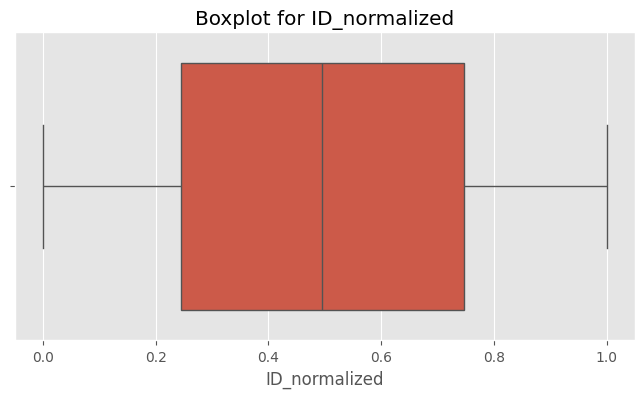

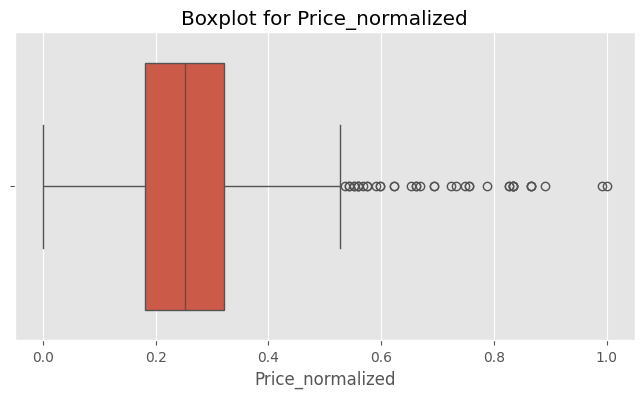

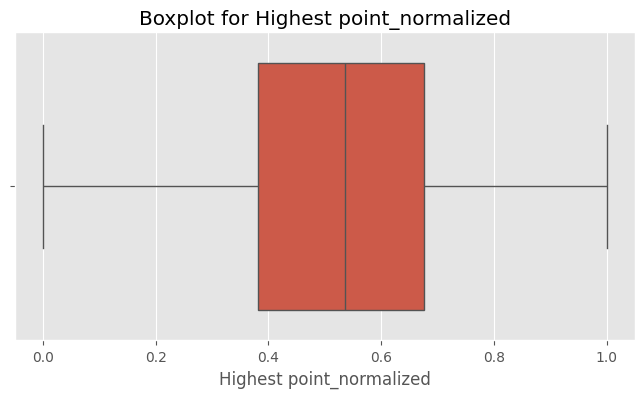

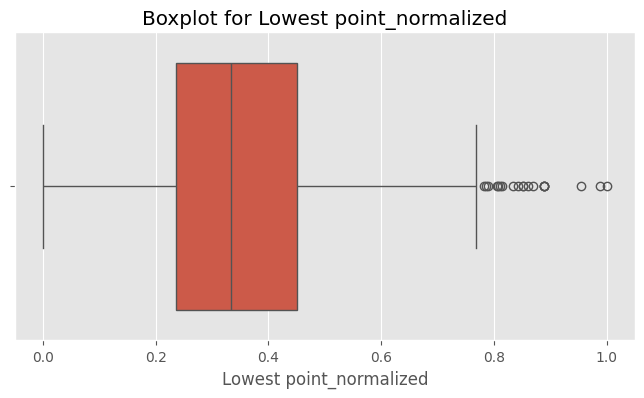

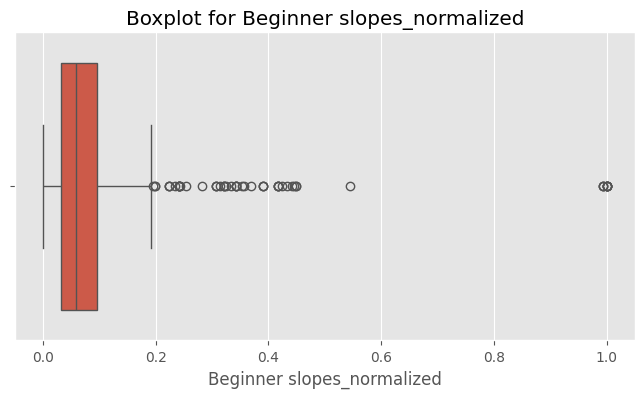

...

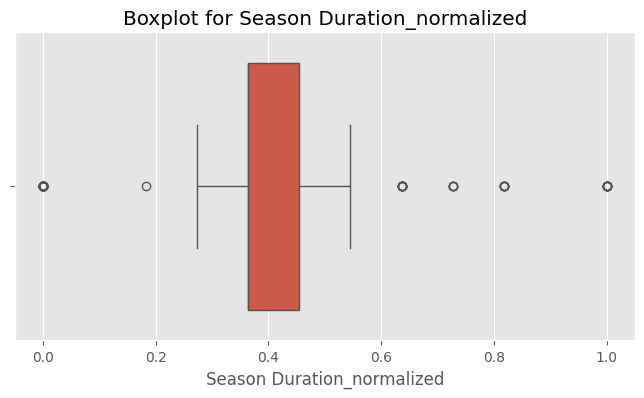

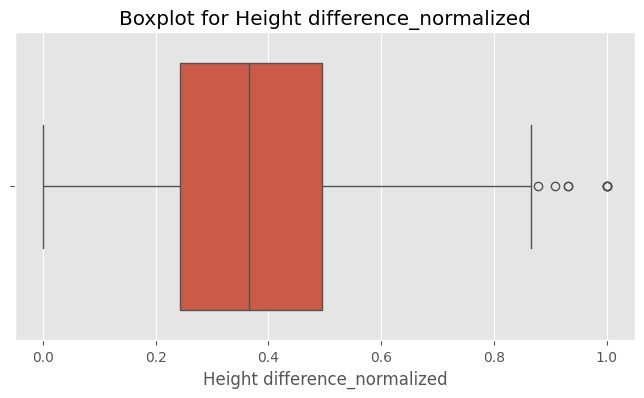

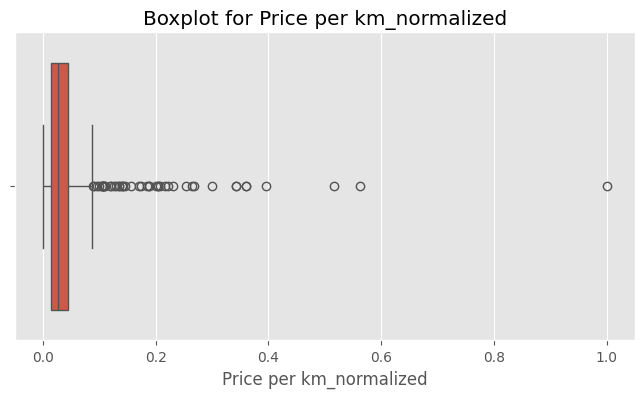

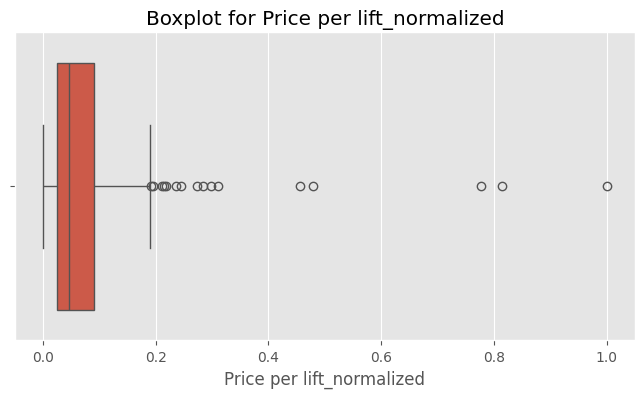

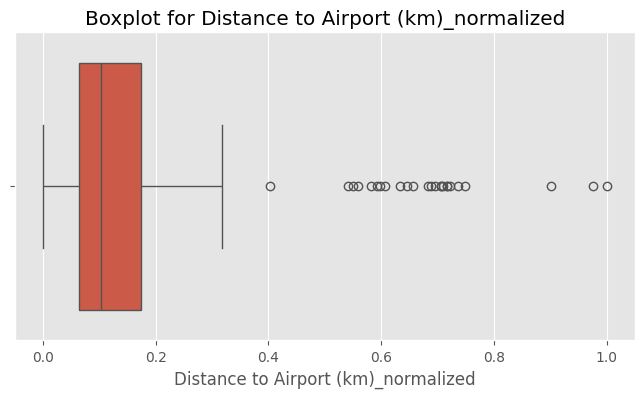

In [ ]:
normalized_columns = [f"{col}_normalized" for col in columns_to_normalize]


for col in normalized_columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df_normalized[col])
    plt.title(f'Boxplot for {col}')
    plt.xlabel(col)
    plt.show()

**Key Observations**

Outliers:

Many columns (e.g., Price, Beginner slopes, Price per km) show significant outliers, indicating extreme or unique values in the dataset.
Skewed Distributions:

Parameters like Snow cannons and Surface lifts are heavily skewed, with most values concentrated at the lower end.
Season Timing:

Start Month clusters around the maximum, suggesting most ski seasons begin at the same time, while End Month varies more.
Season Duration:

Most ski resorts have an average season length, but there are outliers with very short or long seasons.
Price Variability:

Columns related to price (Price, Price per km, Price per lift) show high variability, likely reflecting the diversity in resort types.
Height Difference:

The distribution is moderate with fewer outliers, indicating most resorts have similar vertical drops.

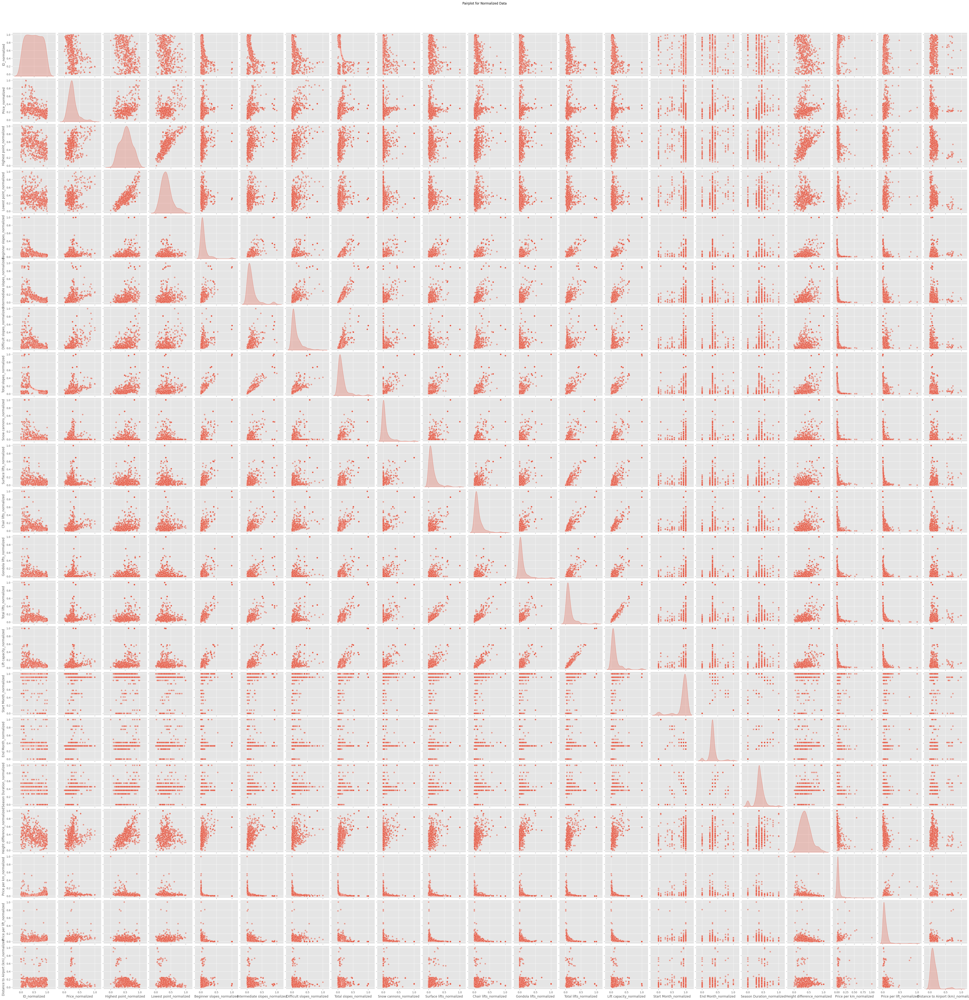

In [ ]:
sns.pairplot(df_normalized[normalized_columns], diag_kind="kde", plot_kws={"alpha": 0.5})
plt.suptitle("Pairplot for Normalized Data", y=1.02)
plt.show()

**Key Observations:**

Correlations:

Clear linear relationships between some features, especially related to slopes, lifts, and prices. This suggests potential correlations to explore further.
Data Clusters:

Some feature pairs show potential clustering, which could be useful for segmentation analysis.
Outliers:

Significant outliers are visible, particularly for price, lift counts, and slope lengths. These may need handling for accurate analysis.
Skewed Distributions:

Many features have skewed or asymmetric distributions, as seen in histograms, indicating a need for normalization or transformations.
Dominant Ranges:

Most data points are concentrated in specific ranges for key features, reflecting common characteristics of resorts.

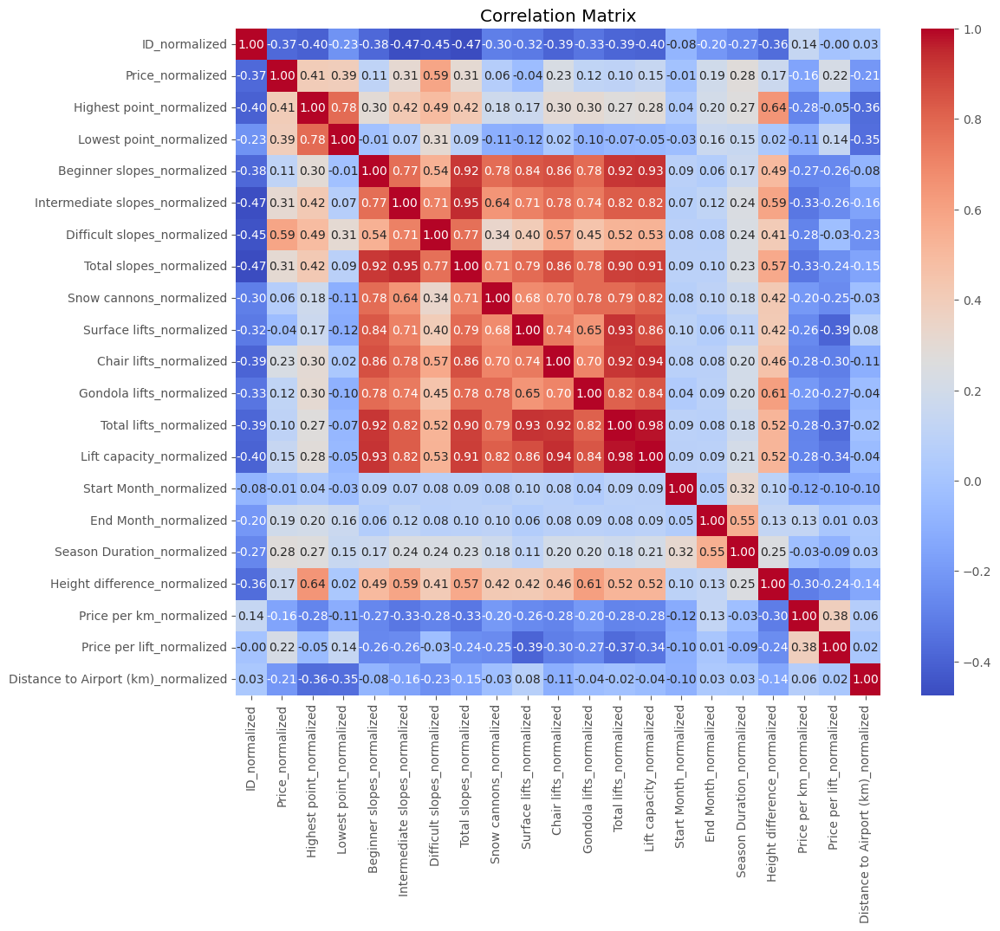

In [140]:
correlation_data = df_normalized[normalized_columns].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_data, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Matrix")
plt.show()

** Key Observations:**
Highly Correlated Features:


Total lifts, Lift capacity, and Chair lifts have very strong correlations (above 0.9). These variables likely represent related aspects of resort infrastructure.
Price Relationships:

Price is moderately correlated with Intermediate slopes (0.59) and Total slopes (0.55), suggesting slopes significantly impact pricing.
Vertical Relationships:

Height difference shows a moderate correlation with Lift capacity (0.64), indicating a possible relationship between altitude variation and resort capacity.
Weak Correlations:

Features like Start Month, End Month, and Distance to Airport (km) show weak correlations with most variables, suggesting minimal impact on the main characteristics of the resorts.
Potential Redundancy:

Strong correlations between lift-related features indicate redundancy. These can be grouped or reduced for dimensionality reduction.

In [143]:
# Function to remove extreme outliers
def remove_outliers(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

In [144]:
columns_to_clean = [
    "Price_normalized",
    "Intermediate slopes_normalized",
    "Beginner slopes_normalized",
    "Difficult slopes_normalized",
    "Total slopes_normalized",
    "Lift capacity_normalized",
    "Chair lifts_normalized",
    "Snow cannons_normalized"
]


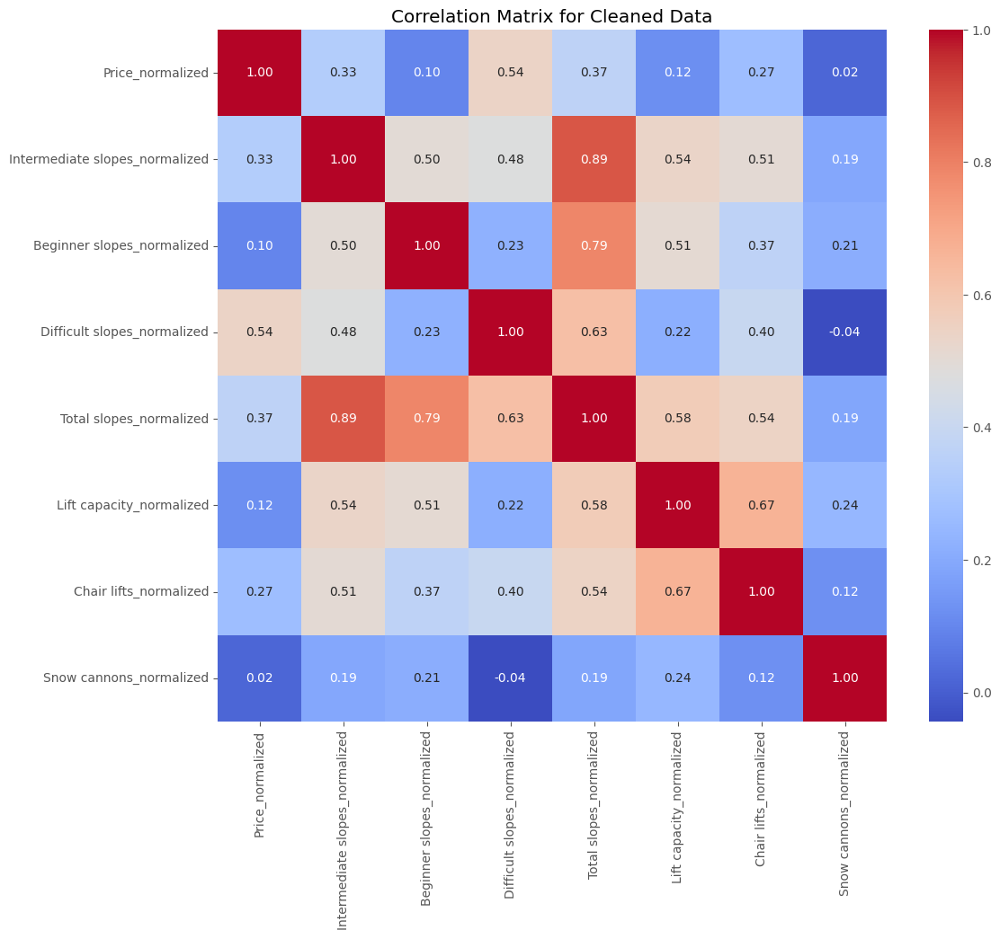

In [145]:
# Create a cleaned dataframe
cleaned_df = remove_outliers(df_normalized.copy(), columns_to_clean)

# Correlation matrix for the cleaned data
cleaned_correlation_data = cleaned_df[columns_to_clean].corr()

# Plot the correlation matrix for cleaned data
plt.figure(figsize=(12, 10))
sns.heatmap(cleaned_correlation_data, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Matrix for Cleaned Data")
plt.show()

1. Correlation with Price:

Difficult slopes has a moderate positive correlation (0.54), indicating that challenging slopes impact resort pricing.
Total slopes and Intermediate slopes are also moderately correlated with Price (0.37 and 0.33, respectively), suggesting that more slopes generally lead to higher prices.

2. Relationships Between Slope Characteristics:

Intermediate slopes and Total slopes have a high correlation (0.89), confirming their dependence.
Beginner slopes is also strongly correlated with Total slopes (0.79).

3. Lifts and Infrastructure:

Chair lifts and Lift capacity are highly correlated (0.67), as more lifts naturally increase overall capacity.
Lift capacity moderately correlates with Total slopes (0.58), indicating a relationship between slope volume and infrastructure.

4. Weak Relationships:

Snow cannons have almost no correlation with other parameters, including Price (0.02), suggesting minimal impact on resort characteristics.

# Key Insights and Unusual Relationships

- Number of slopes significantly impacts resort pricing

- Lift infrastructure is directly linked to resort capacity:

Total lift capacity and the number of chair lifts are strongly correlated with the number of slopes. This emphasizes the critical role of developed infrastructure in supporting large ski areas.

**Challenging slopes drive higher prices:**

Difficult slopes have a noticeable impact on resort pricing. Advanced skiers seem willing to pay a premium for technically challenging trails.
Unexpectedly weak influence of snow cannons:

**The number of snow cannons has almost no correlation with price or other resort characteristics.**
 This suggests that while snow cannons are essential for maintaining slopes in low-snow conditions, they do not directly impact customer perception or pricing.

**Season duration has minimal influence:**

The start and end months of the ski season, as well as its total duration, show weak correlations with price and other key resort features. This indicates that customers prioritize slope quality and infrastructure over the length of the season.

**Multicollinearity among slope characteristics:**

Beginner, intermediate, and difficult slopes are highly interrelated. Resorts with a high number of slopes typically maintain a balanced distribution across all difficulty levels.

**Unusual role of height difference:**
Altitude difference is moderately correlated with lift capacity but has a limited impact on pricing.


# Slopes level and resort height analysis

In [ ]:
#Analysing Height
bins = [0, 1500, 2500, 4000]  # bins and height
labels = ['Low', 'Medium', 'High']
df['Height Category'] = pd.cut(df['Highest point'], bins=bins, labels=labels)


height_analysis = df.groupby('Height Category').agg({
    'Beginner slopes': 'mean',
    'Intermediate slopes': 'mean',
    'Difficult slopes': 'mean',
    'Total slopes': 'mean',
    'Total lifts': 'mean',
    'Lift capacity': 'mean',
    'Price': 'mean'
}).reset_index()


<ipython-input-42-fb434dc0fb59>:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



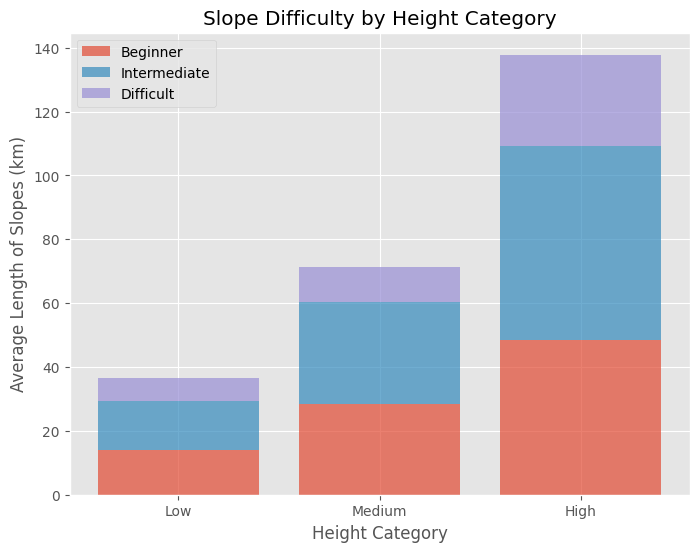

In [ ]:
x = height_analysis['Height Category']
beginner = height_analysis['Beginner slopes']
intermediate = height_analysis['Intermediate slopes']
difficult = height_analysis['Difficult slopes']

plt.figure(figsize=(8, 6))
plt.bar(x, beginner, label='Beginner', alpha=0.7)
plt.bar(x, intermediate, bottom=beginner, label='Intermediate', alpha=0.7)
plt.bar(x, difficult, bottom=beginner + intermediate, label='Difficult', alpha=0.7)
plt.title('Slope Difficulty by Height Category')
plt.xlabel('Height Category')
plt.ylabel('Average Length of Slopes (km)')
plt.legend()
plt.show()

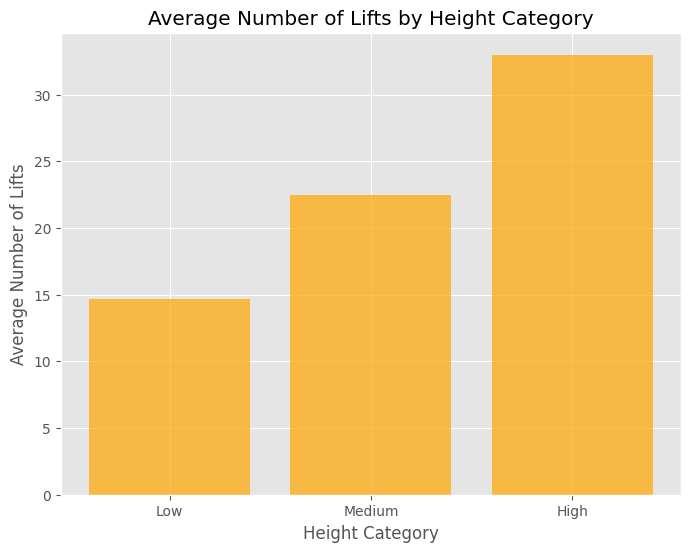

In [ ]:
plt.figure(figsize=(8, 6))
plt.bar(height_analysis['Height Category'], height_analysis['Total lifts'], color='orange', alpha=0.7)
plt.title('Average Number of Lifts by Height Category')
plt.xlabel('Height Category')
plt.ylabel('Average Number of Lifts')
plt.show()

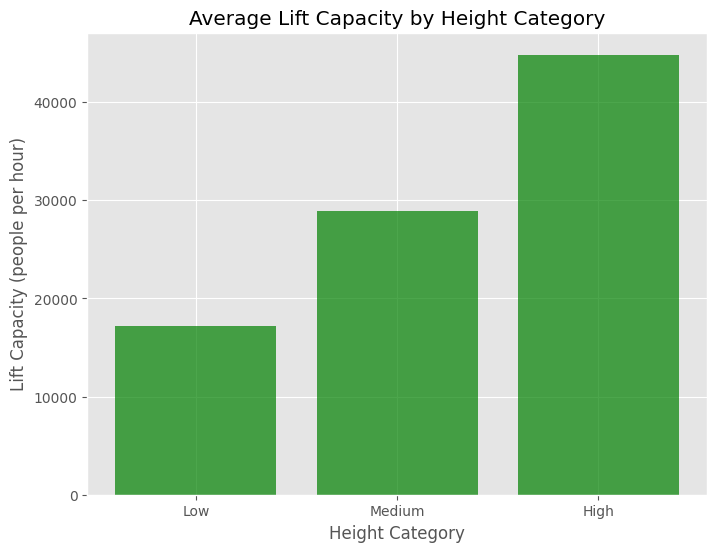

In [ ]:
plt.figure(figsize=(8, 6))
plt.bar(height_analysis['Height Category'], height_analysis['Lift capacity'], color='green', alpha=0.7)
plt.title('Average Lift Capacity by Height Category')
plt.xlabel('Height Category')
plt.ylabel('Lift Capacity (people per hour)')
plt.show()

# Comparison of resorts by countries:

Average indicators of infrastructure, slopes, heights

In [ ]:
country_analysis = df.groupby('Country').agg({
    'Price': 'mean',
    'Highest point': 'mean',
    'Lowest point': 'mean',
    'Total slopes': 'mean',
    'Beginner slopes': 'mean',
    'Intermediate slopes': 'mean',
    'Difficult slopes': 'mean',
    'Total lifts': 'mean',
    'Lift capacity': 'mean'
}).reset_index()

continent_analysis = df.groupby('Continent').agg({
    'Price': 'mean',
    'Highest point': 'mean',
    'Lowest point': 'mean',
    'Total slopes': 'mean',
    'Beginner slopes': 'mean',
    'Intermediate slopes': 'mean',
    'Difficult slopes': 'mean',
    'Total lifts': 'mean',
    'Lift capacity': 'mean'
}).reset_index()

In [ ]:
print("Comparison of resorts by country:")
print(country_analysis)

print("\nComparison of resorts by continent:")
print(continent_analysis)

Comparison of resorts by country:
                   Country      Price  Highest point  Lowest point  \
0                  Andorra  43.000000    2419.000000   1660.000000   
1                Argentina  47.500000    2805.000000   1615.000000   
2                Australia  61.000000    1756.800000   1368.000000   
3                  Austria  44.247191    2089.247191   1021.977528   
4   Bosnia and Herzegovina  20.000000    1889.000000    920.000000   
5                 Bulgaria  26.000000    2334.000000   1159.000000   
6                   Canada  60.600000    1976.800000   1058.000000   
7                    Chile  60.400000    3317.400000   2414.600000   
8                    China   0.000000    1375.000000    457.000000   
9           Czech Republic  28.500000    1218.500000    778.000000   
10                 Finland  42.666667     580.333333    232.333333   
11                  France  38.320988    2406.962963   1249.234568   
12                 Georgia  14.000000    3279.000000   1

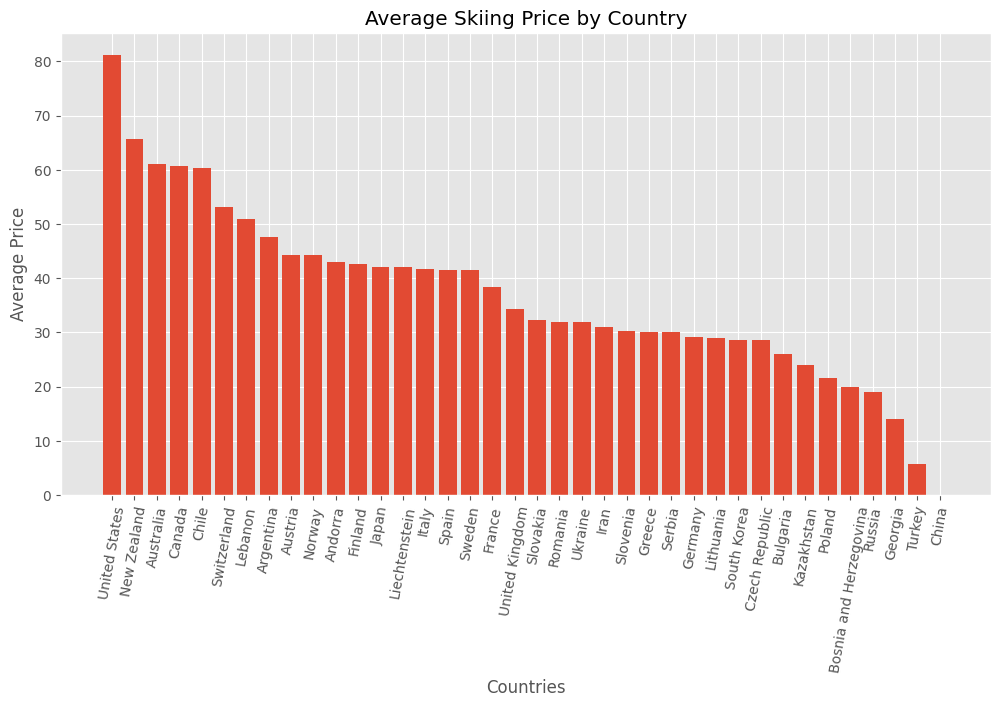

In [ ]:
#Visualization by Countries
plt.style.use('ggplot')
plt.figure(figsize=(12, 6))
country_analysis_sorted = country_analysis.sort_values('Price', ascending=False)
plt.bar(country_analysis_sorted['Country'], country_analysis_sorted['Price'])
plt.title('Average Skiing Price by Country')
plt.xlabel('Countries')
plt.ylabel('Average Price')
plt.xticks(rotation=80)
plt.show()

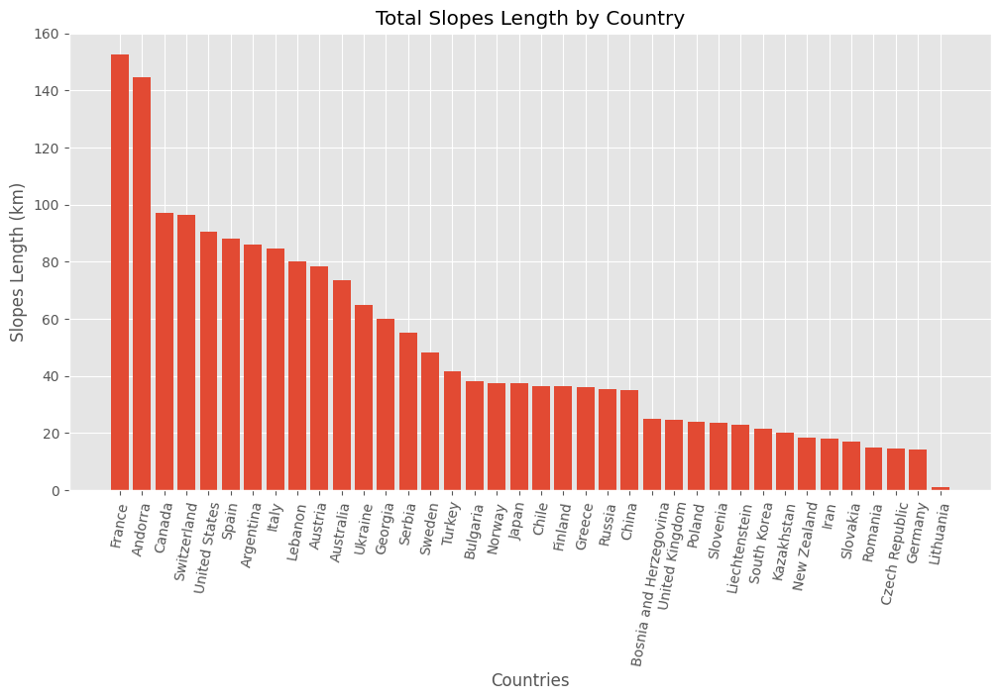

In [ ]:
plt.figure(figsize=(12, 6))
country_analysis_sorted = country_analysis.sort_values('Total slopes', ascending=False)
plt.bar(country_analysis_sorted['Country'], country_analysis_sorted['Total slopes'])
plt.title('Total Slopes Length by Country')
plt.xlabel('Countries')
plt.ylabel('Slopes Length (km)')
plt.xticks(rotation=80)
plt.show()

In [ ]:
resort_count_by_country = df['Country'].value_counts().reset_index()
resort_count_by_country.columns = ['Country', 'Resort Count']

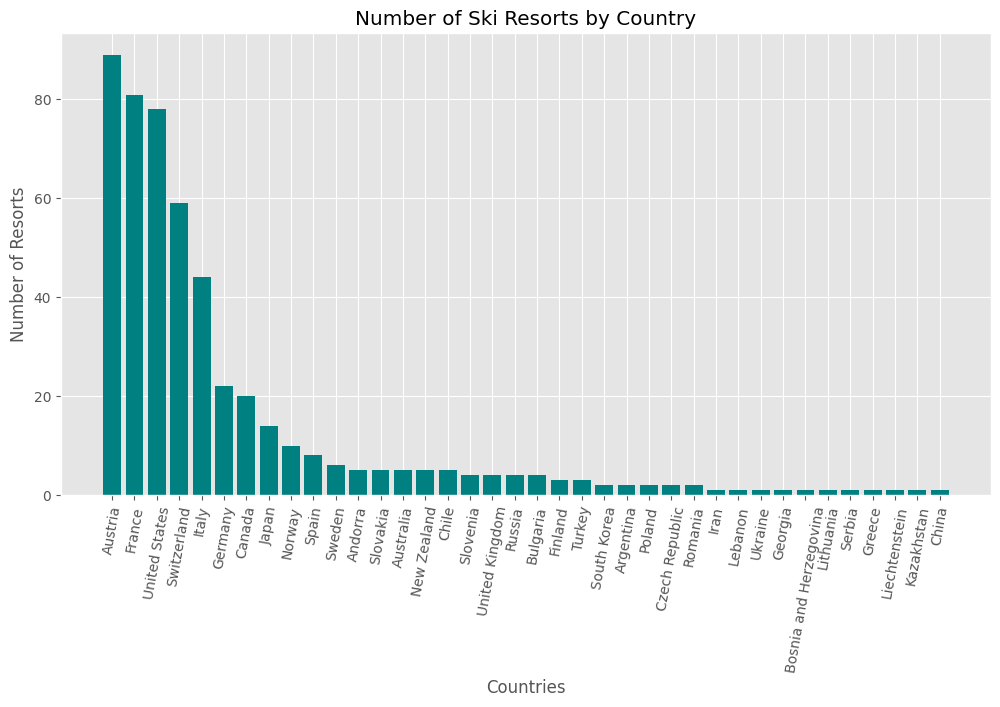

In [ ]:
plt.figure(figsize=(12, 6))
resort_count_by_country_sorted = resort_count_by_country.sort_values('Resort Count', ascending=False)
plt.bar(resort_count_by_country_sorted['Country'], resort_count_by_country_sorted['Resort Count'], color='teal')
plt.title('Number of Ski Resorts by Country')
plt.xlabel('Countries')
plt.ylabel('Number of Resorts')
plt.xticks(rotation=80)
plt.show()

In [ ]:
fig = px.scatter_geo(
    df,
    lat="Latitude",
    lon="Longitude",
    hover_name="Resort",
    hover_data={
        "Country": True,
        "Price": True,
        "Total slopes": True
    },
    size="Total slopes",  # The point size depends on the length of the slopes
    color="Price",
    color_continuous_scale=px.colors.sequential.Viridis,
    title="Global Distribution of Ski Resorts")
fig.update_layout(
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection_type="natural earth"
    ))


fig.show()

In [ ]:
pio.write_html(fig, file="map.html", auto_open=True)

#  Additional Information (regions)

In [ ]:
df.head(10)

,ID,Resort,Latitude,Longitude,Country,Continent,Price,Season,Highest point,Lowest point,...,Total lifts,Lift capacity,Child friendly,Snowparks,Nightskiing,Summer skiing,Ski Zone,Start Month,End Month,Height Category
0,1,Hemsedal,60.928244,8.383487,Norway,Europe,46,November - May,1450,620,...,21,22921,1,1,1,0,Other,11,5,Low
1,2,Geilosiden Geilo,60.534526,8.206372,Norway,Europe,44,November - April,1178,800,...,24,14225,1,1,1,0,Other,11,4,Low
2,3,Golm,47.057810,9.828167,Austria,Europe,48,December - April,2110,650,...,11,16240,1,0,0,0,Other,12,4,Medium
3,4,Red Mountain Resort-Rossland,49.105520,-117.846280,Canada,North America,60,December - April,2075,1185,...,8,9200,1,1,1,0,Other,12,4,Medium
4,5,Hafjell,61.230369,10.529014,Norway,Europe,45,November - April,1030,195,...,18,21060,1,1,1,0,Other,11,4,Low
5,6,Voss,60.683706,6.407905,Norway,Europe,43,November - May,960,284,...,11,11900,1,1,0,0,Other,11,5,Low
6,7,Porter,-39.670988,176.876668,New Zealand,Oceania,61,June - September,1980,1300,...,6,5600,0,0,0,1,Other,6,9,Medium
7,8,Nevados de Chilla?n,-36.613844,-72.071805,Chile,South America,57,June - October,2700,1600,...,11,11080,1,1,0,1,Other,6,10,High
8,9,Hochschwarzeck,47.628373,12.920528,Germany,Europe,22,December - April,1385,1030,...,4,2880,1,0,0,0,Other,12,4,Low
9,10,Rossfeld - Berchtesgaden - Oberau,47.651306,13.058977,Germany,Europe,20,December - April,1554,1300,...,4,3229,1,1,1,0,Other,12,4,Medium


**Season duration**

In [ ]:
def calculate_season_duration(row):
    if row['End Month'] >= row['Start Month']:
        return row['End Month'] - row['Start Month'] + 1
    else:
        return 12 - row['Start Month'] + row['End Month'] + 1

df['Season Duration'] = df.apply(calculate_season_duration, axis=1)

In [ ]:
fig = px.scatter(
    df,
    x="Highest point",
    y="Season Duration",
    size="Snow cannons",
    color="Season Duration",
    hover_data={
        "Resort": True,
        "Country": True,
        "Snow cannons": True,
        "Highest point": True,
        "Season Duration": True,
    },
    title="Relationship Between Height, Season Duration, and Snow Cannons",
    labels={
        "Highest point": "Highest Point (m)",
        "Season Duration": "Season Duration (months)",
        "Snow cannons": "Snow Cannons"
    },
    color_continuous_scale=px.colors.sequential.Viridis
)


fig.update_layout(
    xaxis_title="Highest Point (m)",
    yaxis_title="Season Duration (months)",
    showlegend=True
)


fig.show()

In [ ]:
# try to find not only conuntries but region or state for further interesting analysis
def get_region(lat, lon, country):
    try:
        geolocator = Nominatim(user_agent="geoapi")
        location = geolocator.reverse((lat, lon), language='en')
        if location and 'state' in location.raw['address']:
            return location.raw['address']['state']
        elif location and 'region' in location.raw['address']:
            return location.raw['address']['region']
        else:
            return country  # Возвращаем страну, если регион не найден
    except GeocoderTimedOut:
        return country

In [ ]:
df['Region'] = df.apply(lambda row: get_region(row['Latitude'], row['Longitude'], row['Country']), axis=1)


In [ ]:
df['Region'].value_counts()

,count
Region,
Auvergne-Rhône-Alpes,47
Tyrol,36
Salzburg,20
Trentino – Alto Adige/Südtirol,20
Wallis,18
...,...
Sofia-City,1
Silesian Voivodeship,1
Republika Srpska,1


Now there are regions, so it is more interesting to conduct an analysis, since too many resorts are located in different states, regions, provinces, this is important for further more specific analysis.

# Price per KM

In [ ]:
df["Price per km"] = df["Price"] / df["Total slopes"]  # Price per kilometer of slopes
df["Price per lift"] = df["Price"] / df["Total lifts"]

region_price = df.groupby("Region").agg({
    "Price": "mean",
    "Price per km": "mean",
    "Price per lift": "mean",
    "Total lifts": "sum",
    "Total slopes": "sum"
}).reset_index()

region_price_top_expencive = region_price.sort_values(by="Price", ascending=False).head(10)

<ipython-input-120-ea09b25682e7>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-120-ea09b25682e7>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



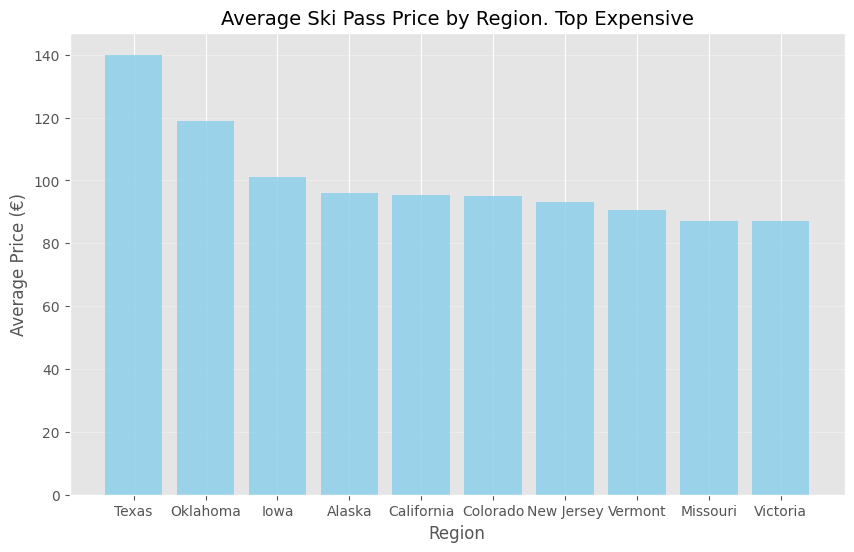

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(region_price_top_expencive["Region"], region_price_top_expencive["Price"], color="skyblue", alpha=0.8)
plt.title("Average Ski Pass Price by Region. Top Expensive", fontsize=14)
plt.xlabel("Region", fontsize=12)
plt.ylabel("Average Price (€)", fontsize=12)
plt.grid(axis="y", alpha=0.3)
plt.show()

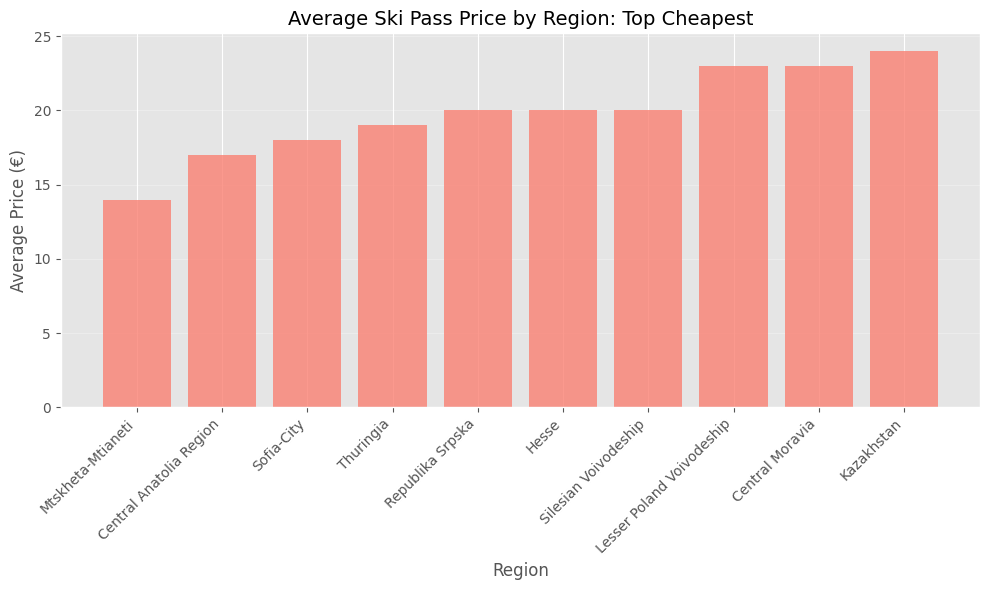

In [ ]:
region_price_top_cheapest = region_price.sort_values(by="Price", ascending=True).head(10)

plt.figure(figsize=(10, 6))
plt.bar(region_price_top_cheapest["Region"], region_price_top_cheapest["Price"], color="salmon", alpha=0.8)
plt.title("Average Ski Pass Price by Region: Top Cheapest", fontsize=14)
plt.xlabel("Region", fontsize=12)
plt.ylabel("Average Price (€)", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

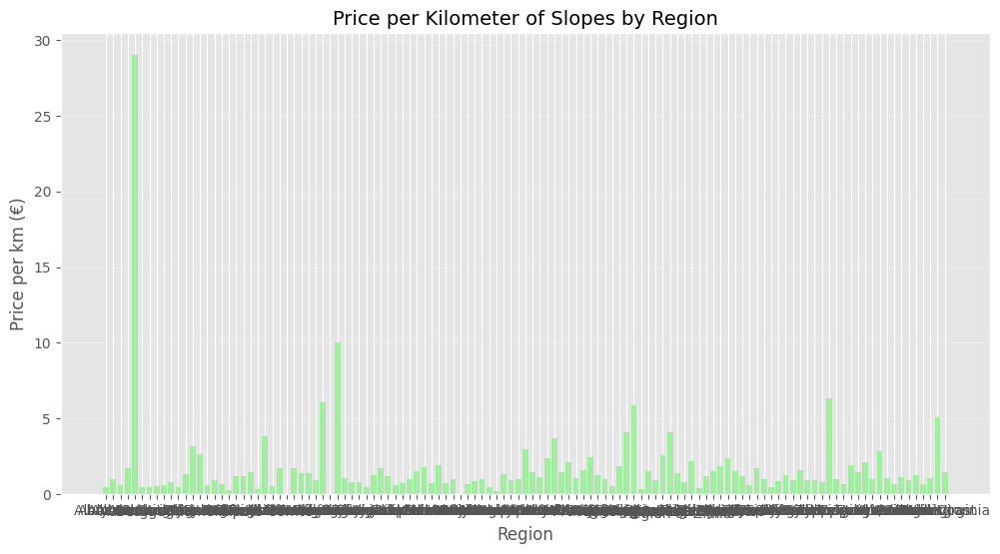

In [ ]:
plt.figure(figsize=(12, 6))
plt.bar(region_price["Region"], region_price["Price per km"], color="lightgreen", alpha=0.8)
plt.title("Price per Kilometer of Slopes by Region", fontsize=14)
plt.xlabel("Region", fontsize=12)
plt.ylabel("Price per km (€)", fontsize=12)
plt.grid(axis="y", alpha=0.3)
plt.show()



In [ ]:
region_price_sorted = region_price.sort_values(by="Price per km", ascending=True)


fig = px.bar(
    region_price_sorted,
    x="Region",
    y="Price per km",
    title="Price per Kilometer of Slopes by Region",
    labels={"Price per km": "Price per km (€)", "Region": "Region"},
    color="Price per km",
    color_continuous_scale="Greens",
    hover_data=["Total lifts", "Total slopes"]
)

fig.update_layout(
    xaxis_title="Region",
    yaxis_title="Price per km (€)",
    xaxis_tickangle=45,
    title_font_size=16
)

fig.show()

The most profitable regions (minimum price per km):

Eastern Anatolia Region, Hellongjiang, Piedmont – offer the best ratio of price and length of trails, with minimal costs per kilometer of the route.
Reasonable prices:

British Columbia, Veneto, Silesian Voyageship – provide reasonable prices for trails, being in the middle of the list.

The most expensive regions (maximum price per km):

Alytus County, Thuringia, Pennsylvania are significantly distinguished by the high cost per kilometer of the route, possibly due to the elite resorts or the small total volume of trails.

In [ ]:
region_price["Efficiency"] = region_price["Total slopes"] / region_price["Price per km"]

region_price_slope = region_price.sort_values(by="Efficiency", ascending=False).head(15)
region_price_slope = region_price_slope[region_price_slope['Price'] != 0]

fig = px.bar(
    region_price_slope,
    x="Region",
    y="Efficiency",
    title="Regions with Best Efficiency (Longest Slopes per Euro)",
    labels={"Efficiency": "Efficiency (km per €)", "Region": "Region"},
    color="Efficiency",
    color_continuous_scale="Blues",
    hover_data=['Region',"Total slopes", "Price per km"]
)

fig.update_layout(
    xaxis_title="Region",
    yaxis_title="Efficiency (km per €)",
    xaxis_tickangle=45,
    title_font_size=16
)


**Efficiency Leaders:**

Auvergne-Rhône-Alpes stands out strongly with maximum slopes efficiency (over 20 km of slopes for 1 €).

- The following regions:

Wallis, Piedmont, and British Columbia occupy lower positions, but still show good results.


- The overall picture:

Most regions have moderate or low efficiency, which means that advantageous combinations of low price and long trails are rare.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499 entries, 0 to 498
Data columns (total 33 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   ID                   499 non-null    int64   
 1   Resort               499 non-null    object  
 2   Latitude             499 non-null    float64 
 3   Longitude            499 non-null    float64 
 4   Country              499 non-null    object  
 5   Continent            499 non-null    object  
 6   Price                499 non-null    int64   
 7   Season               499 non-null    object  
 8   Highest point        499 non-null    int64   
 9   Lowest point         499 non-null    int64   
 10  Beginner slopes      499 non-null    int64   
 11  Intermediate slopes  499 non-null    int64   
 12  Difficult slopes     499 non-null    int64   
 13  Total slopes         499 non-null    int64   
 14  Snow cannons         499 non-null    int64   
 15  Surface lifts        49

# **Best region to start a season**

In [ ]:
fall_resorts = df[(df["Start Month"] <= 11)]
best_work_resorts = fall_resorts.sort_values(by="Total slopes", ascending=False).head(15)

fig = px.bar(
    best_work_resorts,
    x="Resort",
    y="Total slopes",
    title="Best Regions Operating in November",
    labels={"Total slopes": "Total Slopes (km)", "Region": "Region"},
    color="Total slopes",
    color_continuous_scale="Blues",
    hover_data=["Country", 'Start Month', 'End Month', 'Highest point']
)

fig.update_layout(
    xaxis_title="Resort",
    yaxis_title="Total Slopes (km)",
    xaxis_tickangle=45,
    title_font_size=16
)

In [ ]:
longest_season_regions = df.sort_values(by="Season Duration", ascending=False)

longest_season_regions = longest_season_regions[longest_season_regions['Season Duration'] != 0]
fig = px.bar(
    longest_season_regions,
    x="Region",
    y="Season Duration",
    title="Regions with the Longest Ski Season",
    labels={"Season Duration": "Season Duration (Months)", "Region": "Region"},
    color="Season Duration",
    color_continuous_scale="Greens",
    hover_data=['Resort',"Country", "Total slopes", 'Price']
)

fig.update_layout(
    xaxis_title="Region",
    yaxis_title="Season Duration (Months)",
    xaxis_tickangle=45,
    title_font_size=16
)


Key leaders:

Auvergne-Rhône-Alpes, Tyrol and British Columbia have one of the longest seasons. This is due to the presence of glaciers or artificial snowmaking.
Grisons and Wallis also occupy high positions, confirming that Switzerland and its regions are known for long seasons.

Temperate regions:

Most regions have an average season duration (5-7 months). This is the standard period for ski resorts operating from late autumn to early spring.
Regions with a short season:

The regions shown closer to the right edge of the graph have a season of less than 4 months. This is probably due to low mountain systems or a warmer climate.

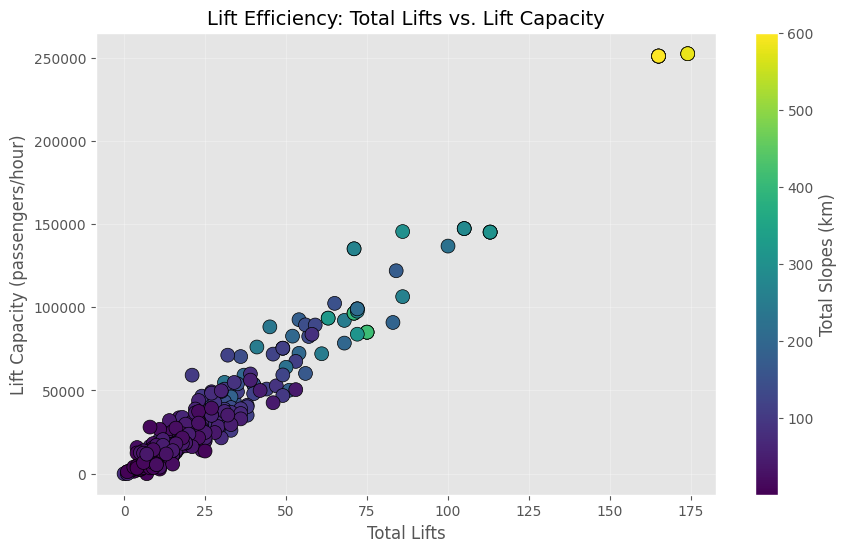

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(df["Total lifts"], df["Lift capacity"], c=df["Total slopes"], cmap='viridis', s=100, edgecolor='k')
plt.colorbar(label="Total Slopes (km)")
plt.title("Lift Efficiency: Total Lifts vs. Lift Capacity", fontsize=14)
plt.xlabel("Total Lifts", fontsize=12)
plt.ylabel("Lift Capacity (passengers/hour)", fontsize=12)
plt.grid(alpha=0.3)
plt.show()

The Lift Capacity increases with the increase in the number of lifts (Total Lifts). This confirms the effectiveness of increasing the number of ski lifts at resorts.

The two resorts clearly stand out for their high Lift Capacity (over 250,000 passengers per hour) and large number of lifts (~175). These resorts also have the longest network of trails (highlighted in yellow), which indicates their large size.

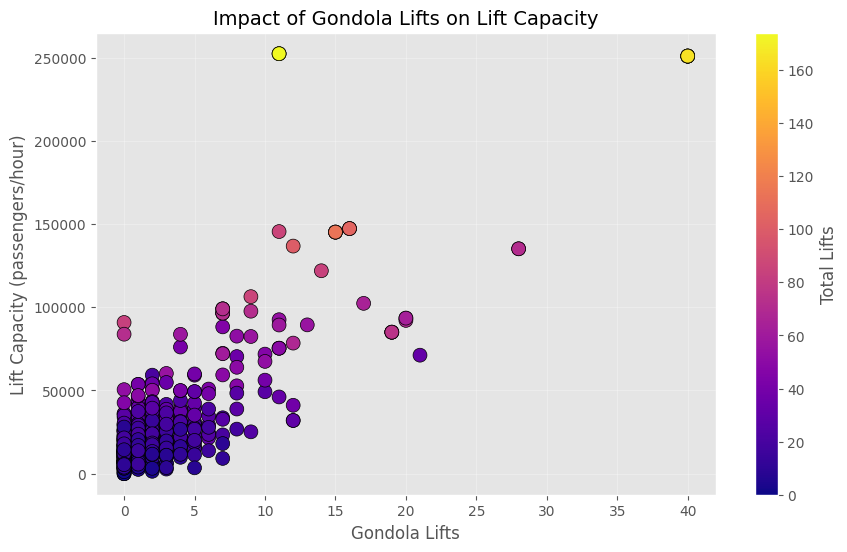

In [ ]:
grouped = df.groupby("Total lifts").agg({
    "Lift capacity": ["mean", "max"],
    "Gondola lifts": "mean",
    "Total slopes": "mean"
}).reset_index()

grouped.columns = ["Total Lifts", "Mean Lift Capacity", "Max Lift Capacity", "Mean Gondola Lifts", "Mean Total Slopes"]

plt.figure(figsize=(10, 6))
plt.scatter(df["Gondola lifts"], df["Lift capacity"], c=df["Total lifts"], cmap="plasma", s=100, edgecolor="k")
plt.colorbar(label="Total Lifts")
plt.title("Impact of Gondola Lifts on Lift Capacity", fontsize=14)
plt.xlabel("Gondola Lifts", fontsize=12)
plt.ylabel("Lift Capacity (passengers/hour)", fontsize=12)
plt.grid(alpha=0.3)
plt.show()

There is a clear growth trend in Lift Capacity with an increase in the number of Gondola Lifts. This confirms that gondolas are a key element for increasing the resort's capacity.

efficiency of gondolas:
Gondola lifts significantly increase the resort's capacity, especially in large networks.
Development strategy:
To increase capacity, small resorts should invest in gondolas, even with a small number of lifts.

# The top 15 regions in terms of the number of resorts

In [ ]:
#top 15 regions
top_regions = df['Region'].value_counts().head(15)
top_regions

,count
Region,
Auvergne-Rhône-Alpes,47
Tyrol,36
Salzburg,20
Trentino – Alto Adige/Südtirol,20
Wallis,18
Bavaria,17
Grisons,15
Provence-Alpes-Côte d'Azur,14
Occitania,13


In [ ]:
top_df = df[df['Region'].isin(top_regions.index)]

In [ ]:
top_df

,ID,Resort,Latitude,Longitude,Country,Continent,Price,Season,Highest point,Lowest point,...,Start Month,End Month,Height Category,Season Duration,Region,Height difference,Price per km,Price per lift,Nearest Airport,Distance to Airport (km)
0,1,Hemsedal,60.928244,8.383487,Norway,Europe,46,November - May,1450,620,...,11,5,Low,7,Norway,830,1.069767,2.190476,Ventspils International Airport,849.739386
1,2,Geilosiden Geilo,60.534526,8.206372,Norway,Europe,44,November - April,1178,800,...,11,4,Low,6,Norway,378,1.294118,1.833333,Ventspils International Airport,843.429804
2,3,Golm,47.057810,9.828167,Austria,Europe,48,December - April,2110,650,...,12,4,Medium,5,Vorarlberg,1460,1.846154,4.363636,Il Caravaggio International Airport,154.128768
3,4,Red Mountain Resort-Rossland,49.105520,-117.846280,Canada,North America,60,December - April,2075,1185,...,12,4,Medium,5,British Columbia,890,0.500000,7.500000,Castlegar/West Kootenay Regional Airport,26.353184
4,5,Hafjell,61.230369,10.529014,Norway,Europe,45,November - April,1030,195,...,11,4,Low,6,Norway,835,1.022727,2.500000,Ventspils International Airport,760.122711
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
493,494,Gra?chen,46.196018,7.842161,Switzerland,Europe,48,December - April,2864,1619,...,12,4,High,5,Wallis,1245,1.142857,3.200000,Malpensa International Airport,93.134268
494,495,Puigmal,42.395007,2.108883,France,Europe,0,Unknown,2700,1830,...,0,0,High,1,Occitania,870,0.000000,0.000000,Barcelona International Airport,121.970985
495,496,Kranzberg-Mittenwald,47.451359,11.228630,Germany,Europe,29,December,1350,980,...,12,12,Low,1,Bavaria,370,1.933333,2.900000,Il Caravaggio International Airport,229.559889
496,497,Wetterstein lifts-Wettersteinbahnen- Ehrwald,47.406897,10.927998,Austria,Europe,43,December - March,1530,1000,...,12,3,Medium,4,Tyrol,530,1.869565,4.300000,Il Caravaggio International Airport,214.291152


More than half of the resorts are located in 15 regions (not even countries)

In [ ]:
region_slopes = top_df.groupby("Region").agg({
    "Beginner slopes": "sum",
    "Intermediate slopes": "sum",
    "Difficult slopes": "sum",
    "Total slopes": "sum"
}).reset_index()

region_slopes["Beginner (%)"] = (region_slopes["Beginner slopes"] / region_slopes["Total slopes"]) * 100
region_slopes["Intermediate (%)"] = (region_slopes["Intermediate slopes"] / region_slopes["Total slopes"]) * 100
region_slopes["Difficult (%)"] = (region_slopes["Difficult slopes"] / region_slopes["Total slopes"]) * 100



In [ ]:
fig = px.bar(
    region_slopes,
    x="Region",
    y=["Beginner (%)", "Intermediate (%)", "Difficult (%)"],
    title="Slope Level Distribution by Region",
    labels={"value": "Percentage (%)", "Region": "Region"},
    barmode="stack",
    color_discrete_map={
        "Beginner (%)": "#99FF99",
        "Intermediate (%)": "#99CCFF", # Голубой для средних трасс
        "Difficult (%)": "#FF9999"     # Зеленый для сложных трасс
    }
)

fig.update_layout(
    xaxis_title="Region",
    yaxis_title="Percentage (%)",
    title_font_size=16
)

fig

Regions with a high proportion of trails for beginners:

Norway and Occitania have a significant percentage of "Beginner slopes".
 This makes them especially attractive for beginners and families with children.
Regions with dominant mid-level routes:

Most regions, such as British Columbia and Bavaria, have a predominant percentage of "Intermediate slopes". This indicates a balanced profile for intermediate skiers
"Colorado" is one of the most challenging resorts.

# Airport Information

Finding new features.

I decided to add the nearest airports
To do this, I found a dataset with airports and filtered out the most similar ones for public ones.

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving airports.zip to airports.zip


In [ ]:
!unzip airports.zip

Archive:  airports.zip
  inflating: Airports-Only.csv       


In [ ]:
air = pd.read_csv('/content/Airports-Only.csv', encoding='latin1')

In [ ]:
air

,Airport_ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,TZ,Type,Source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789002,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7693,14106,Rogachyovo Air Base,Belaya,Russia,\N,ULDA,71.616699,52.478298,272,\N,\N,\N,airport,OurAirports
7694,14107,Ulan-Ude East Airport,Ulan Ude,Russia,\N,XIUW,51.849998,107.737999,1670,\N,\N,\N,airport,OurAirports
7695,14108,Krechevitsy Air Base,Novgorod,Russia,\N,ULLK,58.625000,31.385000,85,\N,\N,\N,airport,OurAirports
7696,14109,Desierto de Atacama Airport,Copiapo,Chile,CPO,SCAT,-27.261200,-70.779198,670,\N,\N,\N,airport,OurAirports


In [ ]:
air_filtered = air[(air['IATA'] != '\\N') & (air['ICAO'] != '\\N')]
air_filtered

,Airport_ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,TZ,Type,Source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789002,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7684,14097,Bilogai-Sugapa Airport,Sugapa-Papua Island,Indonesia,UGU,WABV,-3.739560,137.031998,7348,\N,\N,\N,airport,OurAirports
7687,14100,Ramon Airport,Eilat,Israel,ETM,LLER,29.723694,35.011416,288,\N,\N,\N,airport,OurAirports
7688,14101,Rustaq Airport,Al Masna'ah,Oman,MNH,OORQ,23.640556,57.487500,349,\N,\N,\N,airport,OurAirports
7689,14102,Laguindingan Airport,Cagayan de Oro City,Philippines,CGY,RPMY,8.612203,124.456496,190,\N,\N,\N,airport,OurAirports


In [ ]:
air_filtered['Type'].value_counts()

,count
Type,
airport,6072


In [ ]:
public_airports = air_filtered[
    (air_filtered['Name'].str.contains('International|Regional|Domestic', case=False, na=False))
]

public_airports

,Airport_ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,TZ,Type,Source
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports
5,6,Wewak International Airport,Wewak,Papua New Guinea,WWK,AYWK,-3.583830,143.669006,19,10,U,Pacific/Port_Moresby,airport,OurAirports
15,16,Keflavik International Airport,Keflavik,Iceland,KEF,BIKF,63.985001,-22.605600,171,0,N,Atlantic/Reykjavik,airport,OurAirports
33,34,Castlegar/West Kootenay Regional Airport,Castlegar,Canada,YCG,CYCG,49.296398,-117.632004,1624,-8,A,America/Vancouver,airport,OurAirports
48,49,Edmonton International Airport,Edmonton,Canada,YEG,CYEG,53.309700,-113.580002,2373,-7,A,America/Edmonton,airport,OurAirports
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7581,13575,Duqm International Airport,Duqm,Oman,DQM,OODQ,19.501944,57.634167,364,4,N,\N,airport,OurAirports
7645,13725,Kannur International Airport,Kannur,India,CNN,VOKN,11.918614,75.547211,330,\N,\N,\N,airport,OurAirports
7651,13757,Vidalia Regional Airport,Vidalia,United States,VDI,KVDI,32.192699,-82.371201,275,-4,A,\N,airport,OurAirports
7654,13760,New Islamabad International Airport,Islamabad,Pakistan,ISB,OPIS,33.560713,72.851613,1646,5,U,\N,airport,OurAirports


In [ ]:
air.isna().sum()

,0
Airport_ID,0
Name,0
City,49
Country,0
IATA,0
ICAO,0
Latitude,0
Longitude,0
Altitude,0
Timezone,0


In [ ]:
def find_nearest_airport(resort_coords, airports):
    distances = airports.apply(lambda row: geodesic(resort_coords, (row["Latitude"], row["Longitude"])).km, axis=1)
    nearest_idx = distances.idxmin()
    return air.loc[nearest_idx, "Name"], distances.min()

In [ ]:
df["Nearest Airport"] = df.apply(
    lambda row: find_nearest_airport((row["Latitude"], row["Longitude"]), public_airports)[0], axis=1)
df["Distance to Airport (km)"] = df.apply(
    lambda row: find_nearest_airport((row["Latitude"], row["Longitude"]), public_airports)[1], axis=1)

In [ ]:
df

,ID,Resort,Latitude,Longitude,Country,Continent,Price,Season,Highest point,Lowest point,...,Start Month,End Month,Height Category,Season Duration,Region,Height difference,Price per km,Price per lift,Nearest Airport,Distance to Airport (km)
0,1,Hemsedal,60.928244,8.383487,Norway,Europe,46,November - May,1450,620,...,11,5,Low,7,Norway,830,1.069767,2.190476,Ventspils International Airport,849.739386
1,2,Geilosiden Geilo,60.534526,8.206372,Norway,Europe,44,November - April,1178,800,...,11,4,Low,6,Norway,378,1.294118,1.833333,Ventspils International Airport,843.429804
2,3,Golm,47.057810,9.828167,Austria,Europe,48,December - April,2110,650,...,12,4,Medium,5,Vorarlberg,1460,1.846154,4.363636,Il Caravaggio International Airport,154.128768
3,4,Red Mountain Resort-Rossland,49.105520,-117.846280,Canada,North America,60,December - April,2075,1185,...,12,4,Medium,5,British Columbia,890,0.500000,7.500000,Castlegar/West Kootenay Regional Airport,26.353184
4,5,Hafjell,61.230369,10.529014,Norway,Europe,45,November - April,1030,195,...,11,4,Low,6,Norway,835,1.022727,2.500000,Ventspils International Airport,760.122711
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,495,Puigmal,42.395007,2.108883,France,Europe,0,Unknown,2700,1830,...,0,0,High,1,Occitania,870,0.000000,0.000000,Barcelona International Airport,121.970985
495,496,Kranzberg-Mittenwald,47.451359,11.228630,Germany,Europe,29,December,1350,980,...,12,12,Low,1,Bavaria,370,1.933333,2.900000,Il Caravaggio International Airport,229.559889
496,497,Wetterstein lifts-Wettersteinbahnen- Ehrwald,47.406897,10.927998,Austria,Europe,43,December - March,1530,1000,...,12,3,Medium,4,Tyrol,530,1.869565,4.300000,Il Caravaggio International Airport,214.291152
497,498,Stuhleck-Spital am Semmering,47.574195,15.789964,Austria,Europe,42,April,1774,777,...,4,4,Medium,1,Styria,997,1.750000,4.666667,Vienna International Airport,83.423330


In [ ]:
df['Nearest Airport'].value_counts()

,count
Nearest Airport,
Il Caravaggio International Airport,104
Geneva Cointrin International Airport,61
Vienna International Airport,39
Malpensa International Airport,33
Barcelona International Airport,26
...,...
Beirut Rafic Hariri International Airport,1
La Macaza / Mont-Tremblant International Inc Airport,1
Fort Wayne International Airport,1


In [ ]:
region_distance = df.groupby("Region")["Distance to Airport (km)"].mean().reset_index()
region_distance = region_distance.sort_values(by="Distance to Airport (km)")



fig = px.bar(
    region_distance,
    x="Region",
    y="Distance to Airport (km)",
    title="Average Distance to Airport by Region",
    labels={"Distance to Airport (km)": "Average Distance (km)", "Region": "Region"},
    color="Distance to Airport (km)",
    color_continuous_scale="Plasma"
)
fig.show()

Regions with minimum average distance to airports:

Pennsylvania, Otago, and Republic Srpska have minimum average distances (almost zero). This may be due to the good infrastructure and proximity of major airports.
Regions with the maximum average distance:

Lapland, Rio Negro Province, and Sweden have maximum distances (over 1,000 km). This indicates that the resorts are difficult to access, probably due to the geographical remoteness or lack of major airports nearby.
European regions:

Most European regions, such as Auvergne-Rhône-Alpes, Grisons, and Tyrol, have relatively short average distances (~100-300 km), which makes them convenient for tourists.
Scandinavia and the Northern regions:

Regions such as Norway and Sweden are showing significant increases in the average distance to airports. This may be caused by geographical features and a lower population density.

In [ ]:
region_analysis_dist = df.groupby("Region").agg({
    "Price": "mean",
    "Distance to Airport (km)": "mean"
}).reset_index()


fig = px.scatter(
    region_analysis_dist,
    x="Distance to Airport (km)",
    y="Price",
    size="Price",
    color="Region",
    title="Region Comparison: Price vs Distance to Airport",
    labels={"Distance to Airport (km)": "Avg Distance (km)", "Price": "Avg Price (€)"}
)
fig.show()

In [ ]:
dist_top_resorts = df.sort_values(by="Distance to Airport (km)", ascending=False)
fig = px.scatter(
    dist_top_resorts,
    x="Distance to Airport (km)",
    y="Price",
    size="Total slopes",
    color="Region",
    hover_name="Resort",
    title="Top Resorts by Distance to Airport",
    labels={"Distance to Airport (km)": "Distance to Airport (km)", "Price": "Price (€)", "Total slopes": "Total Slopes (km)"},
    size_max=40,
)


fig.update_layout(
    xaxis_title="Distance to Airport (km)",
    yaxis_title="Price (€)",
    title_font_size=16
)

fig.show()

Resorts located more than 600-1000 km from the airport are located in such regions as Lapland and North Ostrobothnia.
Despite the remoteness, the price for them can be high, which may be due to the uniqueness of the location.

Resorts in Norway and Japan have higher prices (over 100 €), even if they are located at a great distance from the airport.
Resorts in regions such as Salzburg and Auvergne-Rhône-Alpes offer more affordable prices with relatively short distances to the airport.

In [ ]:
top_df = top_df.sort_values(by="Distance to Airport (km)", ascending=False)
fig = px.scatter(
    top_df,
    x="Distance to Airport (km)",
    y="Price",
    size="Total slopes",
    color="Region",
    hover_name="Resort",
    title="Top 15 Resorts by Distance to Airport",
    labels={"Distance to Airport (km)": "Distance to Airport (km)", "Price": "Price (€)", "Total slopes": "Total Slopes (km)"},
    size_max=40,
)


fig.update_layout(
    xaxis_title="Distance to Airport (km)",
    yaxis_title="Price (€)",
    title_font_size=16
)

fig.show()

For tourists:

Choose resorts with a short distance to the airport (<200 km) to save on logistics, especially in regions such as Salzburg and Auvergne-Rhône-Alpes.
Consider remote resorts such as Lapland for a unique experience.
For business:

Increase the attractiveness of remote resorts by improving transport accessibility (for example, transfers).
Use slope size data to market premium resorts.